# Análise exploratória de casos de Zika notificado pelo SUS

Neste tutorial vamos explorar como começar a entender a descrição de casos do sistema de notificação de agravos do SUS, o SINAN. Estes dados são bastante ricos e a [documentação](www.sgc.goias.gov.br/upload/arquivos/2013-08/dengue2.pdf) sobre o significado de cada uma das variáveis pode ser encontrada [aqui](www.sgc.goias.gov.br/upload/arquivos/2013-08/dengue2.pdf).

In [2]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster
import seaborn as sns
%pylab inline

Populating the interactive namespace from numpy and matplotlib


Primeiro vamos começar pelo carregamento dos dados a partir do site do InfoDengue. Como o dado está no formato CSV, nós vamos utilizar a biblioteca pandas para carregar os dados diretamente da web, em um Dataframe.

In [3]:
casos = pd.read_csv('https://info.dengue.mat.br/dumps/Mosquito.Borne.Disease.tar.gz',compression='gzip',header=0, index_col=0)

/usr/local/lib/python3.5/dist-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (42,43,44,45) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Vejamos os nomes da variáveis

In [4]:
casos.columns

Index(['ID_AGRAVO', 'DT_NOTIFIC', 'SEM_NOT', 'NU_ANO', 'SG_UF_NOT',
       'ID_MUNICIP', 'ID_REGIONA', 'ID_UNIDADE', 'DT_SIN_PRI', 'SEM_PRI',
       'DT_NASC', 'NU_IDADE_N', 'CS_SEXO', 'CS_GESTANT', 'CS_RACA',
       'CS_ESCOL_N', 'SG_UF', 'ID_MN_RESI', 'ID_RG_RESI', 'ID_DISTRIT',
       'ID_BAIRRO', 'NM_BAIRRO', 'NU_CEP', 'NU_DDD_TEL', 'CS_ZONA', 'ID_PAIS',
       'NDUPLIC_N', 'DT_INVEST', 'ID_OCUPA_N', 'CLASSI_FIN', 'CRITERIO',
       'TPAUTOCTO', 'COUFINF', 'COPAISINF', 'COMUNINF', 'CODISINF',
       'DOENCA_TRA', 'EVOLUCAO', 'DT_OBITO', 'DT_ENCERRA', 'DT_DIGITA',
       'DT_TRANSSM', 'DT_TRANSRM', 'DT_TRANSRS', 'DT_TRANSSE', 'NU_LOTE_V',
       'NU_LOTE_H', 'CS_FLXRET', 'FLXRECEBI', 'IDENT_MICR', 'MIGRADO_W',
       'TP_SISTEMA', 'latitude', 'longitude', 'NM_DISEASE'],
      dtype='object')

In [5]:
casos = casos[casos.ID_AGRAVO=='A928']
casos.head()

,ID_AGRAVO,DT_NOTIFIC,SEM_NOT,NU_ANO,SG_UF_NOT,ID_MUNICIP,ID_REGIONA,ID_UNIDADE,DT_SIN_PRI,SEM_PRI,...,NU_LOTE_V,NU_LOTE_H,CS_FLXRET,FLXRECEBI,IDENT_MICR,MIGRADO_W,TP_SISTEMA,latitude,longitude,NM_DISEASE
Mosquito.Borne.Disease.csv,,,,,,,,,,,,,,,,,,,,,
54095.0,A928,2016-02-02,5.0,2016.0,33.0,330455.0,NaN,5456932.0,2016-01-16,2.0,...,2016013.0,NaN,1.0,2.0,3.304550e+10,NaN,NaN,-22.75613,-43.46074,Zika
54096.0,A928,2016-02-02,5.0,2016.0,33.0,330455.0,NaN,6638651.0,2016-02-01,5.0,...,2016024.0,NaN,0.0,2.0,3.304550e+10,NaN,NaN,-22.90685,-43.17290,Zika
54097.0,A928,2016-02-19,7.0,2016.0,33.0,330455.0,NaN,2295415.0,2016-02-13,6.0,...,2016015.0,NaN,0.0,2.0,3.304550e+10,NaN,NaN,-22.93618,-43.25596,Zika
54098.0,A928,2016-01-04,1.0,2016.0,33.0,330455.0,NaN,3603474.0,2015-12-17,50.0,...,2016013.0,NaN,0.0,2.0,3.304550e+10,NaN,NaN,-22.93102,-43.23628,Zika
54099.0,A928,2016-01-28,4.0,2016.0,33.0,330455.0,NaN,2269651.0,2016-01-28,4.0,...,2016038.0,NaN,0.0,2.0,3.304550e+10,NaN,NaN,-22.93548,-43.19199,Zika


Estes dados correspondem a todos os casos de Zika notificados ao SUS durante um período. Neste caso de 2015 a 2016. Para podermos tratar adequadamente estes dados para fins de visualização ou análise precisamos corrigir os tipos das colunas. Por exemplo vamos converter as datas.

In [6]:
casos.DT_NOTIFIC = pd.to_datetime(casos.DT_NOTIFIC)

Para poder organizar os dados temporalmente, é útil indexar a tabela por alguma variável temporal. Vamos usar a data de notifiacão de cada caso como índice

In [7]:
casos = casos.set_index('DT_NOTIFIC')

Agora podemos plotar o número de casos por semana de dengue na cidade do Rio de Janeiro.

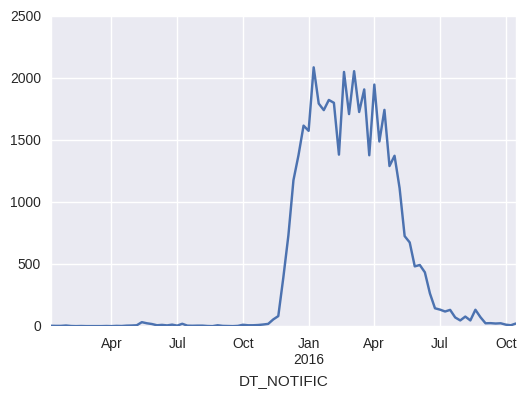

In [8]:
casos.ID_AGRAVO.resample('1W').count().plot();

Suponhamos agora que desejamos visualizar em um mapa os casos que ocorreram, por exemplo entre janeiro e agosto de 2016.

In [30]:
# Aparentemente a biblioteca Folium possui algum limite para o númre oed amrcadores e mum mapa 
# e não aparecem todos os casos no mapa abaixo. 
mapa  = folium.Map(location=[-22.914921, -43.194043])
casos_janeiro = casos.ix['2016-01-01':'2016-08-31']
for caso in casos_janeiro[['latitude','longitude']].values.tolist():
    folium.CircleMarker(location=caso, radius=1).add_to(mapa)
popups = casos_janeiro.CS_SEXO.values
#mapa.add_children(MarkerCluster(locations=casos_janeiro[['latitude','longitude']].values.tolist()))
mapa